In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

In [2]:
train_df = pd.read_csv('../input/tensorflow-great-barrier-reef/train.csv')
train_df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]


In [3]:
len(train_df)

23501

In [4]:
train_df.sequence.nunique()

20

<AxesSubplot:>

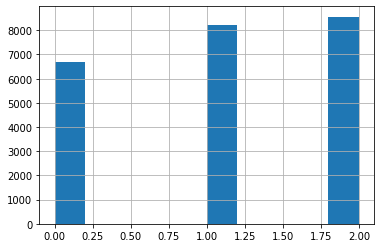

In [5]:
train_df['video_id'].hist()

<AxesSubplot:>

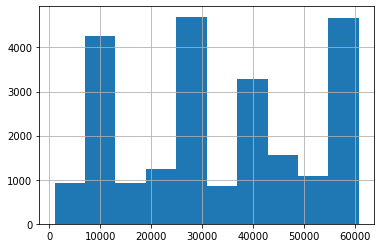

In [6]:
train_df['sequence'].hist()

## Create sequence stats for fold split

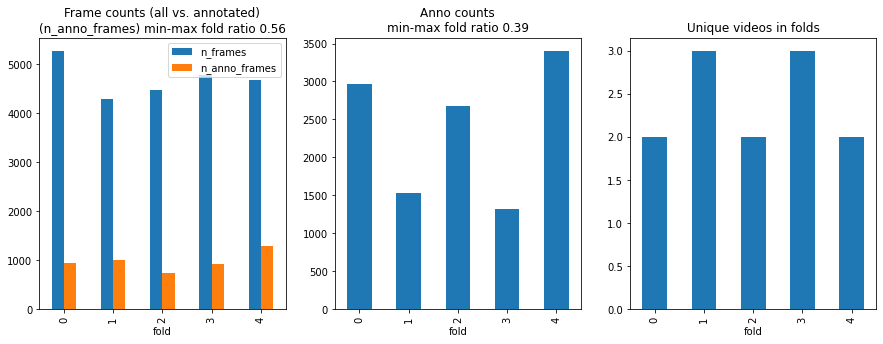

In [19]:
from sklearn.model_selection import StratifiedKFold

def count_bin(n):
    """ Bins are selected so that each bin has 5 sequences"""
    if n < 30:
        return 0
    if n < 120:
        return 1
    if n < 500:
        return 2
    return 3

def split_seq_folds(random_state):
    """ Annotation count-bin-stratified split """
    skf = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=random_state
    )
    
    sequences = []
    for seq in train_df.sequence.unique():
        _df = train_df[train_df['sequence'] == seq]
        n_annotations = np.sum([len(eval(annos)) for annos in _df['annotations'].values])
        n_anno_frames = np.sum([len(eval(annos)) > 0 for annos in _df['annotations'].values])
        anno_frame_p = n_anno_frames / len(_df)

        sequences.append({
            'sequence' : seq,
            'n_frames' : len(_df),
            'n_annotations' : n_annotations,
            'anno_count_bin' : count_bin(n_annotations),
            'video_id' : _df.video_id.values[0],
            'n_anno_frames' : n_anno_frames,
            'anno_frame_p' : anno_frame_p
        })
    
    seq_df = pd.DataFrame(sequences)
    
    # Split to folds
    seq_df['fold'] = -1
    for fold, (train_index, test_index) in enumerate(skf.split(seq_df.index.values, seq_df.anno_count_bin.values)):
        seq_df.at[test_index,'fold'] = fold
    
    return seq_df

def measure_split_balance(seq_df):
    """ 
    Returns the smallest min-max ratio between fold n_frames or n_anno 
    The closer the value is to 1., the more in balance the folds are
    """
    min_max_frames = (seq_df.groupby(['fold']).sum()['n_frames'].min() / 
                seq_df.groupby(['fold']).sum()['n_frames'].max())

    min_max_anno = (seq_df.groupby(['fold']).sum()['n_annotations'].min() / 
                    seq_df.groupby(['fold']).sum()['n_annotations'].max())
    
    return min(min_max_frames, min_max_anno)
    
# find the most balanced 5-fold split
best_random_seed = 0
highest_min_max = 0
for random_seed in range(10):
    val = measure_split_balance(split_seq_folds(random_seed))
    if val > highest_min_max:
        highest_min_max = val
        best_random_seed = random_seed

# apply the most balanced split
seq_df = split_seq_folds(best_random_seed)

f,axs = plt.subplots(1,3, figsize=(15,5))
seq_df.groupby(['fold']).sum()[['n_frames', 'n_anno_frames']].plot.bar(ax=axs[0])
seq_df.groupby(['fold']).sum()['n_annotations'].plot.bar(ax=axs[1])
seq_df.groupby(['fold'])['video_id'].nunique().plot.bar(ax=axs[2])

min_max_frames = (seq_df.groupby(['fold']).sum()['n_anno_frames'].min() / 
                seq_df.groupby(['fold']).sum()['n_anno_frames'].max())

min_max_anno = (seq_df.groupby(['fold']).sum()['n_annotations'].min() / 
                seq_df.groupby(['fold']).sum()['n_annotations'].max())

axs[0].set_title(f'Frame counts (all vs. annotated)\n(n_anno_frames) min-max fold ratio {min_max_frames:.2f}')
axs[1].set_title(f'Anno counts\nmin-max fold ratio {min_max_anno:.2f}')
axs[2].set_title(f'Unique videos in folds')
plt.savefig('../media/fold_split.jpg', transparent=False)

In [20]:
seq_df.to_csv('../input/sequence_stats.csv', index=False)
seq_df

,sequence,n_frames,n_annotations,anno_count_bin,video_id,n_anno_frames,anno_frame_p,fold
0,40258,480,315,2,0,285,0.593750,3
1,45518,798,123,2,0,123,0.154135,4
2,59337,537,193,2,0,156,0.290503,0
3,8399,1423,896,3,0,564,0.396346,3
4,45015,617,24,0,0,22,0.035656,0
5,35305,853,89,1,0,80,0.093787,4
6,53708,1077,1146,3,0,704,0.653668,1
7,996,923,279,2,0,209,0.226436,1
8,60510,1167,113,1,1,113,0.096829,0
9,44160,151,0,0,1,0,0.000000,2


In [21]:
anno_frame_p_total = seq_df.sum()['n_anno_frames'] / seq_df.sum()['n_frames']
print(f'{anno_frame_p_total*100:.1f}% of the frames are annotated in total.')

20.9% of the frames are annotated in total.


<AxesSubplot:>

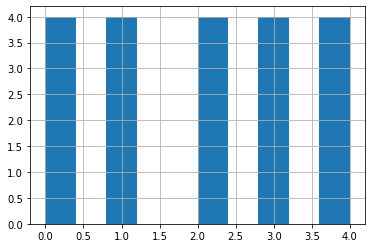

In [22]:
seq_df['fold'].hist()

<AxesSubplot:>

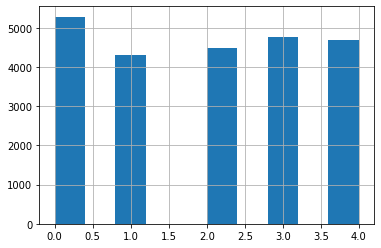

In [23]:
# apply folds
train_df['fold'] = -1
for seq in train_df.sequence.unique():
    seq_index = train_df[train_df['sequence'] == seq].index
    train_df.at[seq_index, 'fold'] = seq_df[seq_df['sequence'] == seq].fold.values[0]
    
train_df['fold'].hist()

In [24]:
train_df.to_csv('../input/train_folds.csv', index=False)
train_df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,fold
0,0,40258,0,0,0-0,[],3
1,0,40258,1,1,0-1,[],3
2,0,40258,2,2,0-2,[],3
3,0,40258,3,3,0-3,[],3
4,0,40258,4,4,0-4,[],3


# Plot annotations

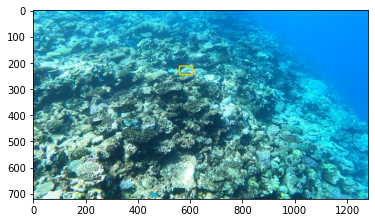

In [115]:
import cv2
ROOT_VIDEOS = '../input/tensorflow-great-barrier-reef/train_images/'

def draw_boxes(img, annos, color=(255,200,0), thickness=3):
    for anno in annos:
        x,y = int(anno['x']), int(anno['y'])
        w,h = int(anno['width']), int(anno['height'])
        img = cv2.rectangle(img,(x,y),(x+w,y+h),color,thickness)
    return img

def get_image(df, idx, draw_annotations=True):
    video_id = df.iloc[idx]['video_id']
    frame_id = df.iloc[idx]['video_frame']
    
    img_fn = os.path.join(ROOT_VIDEOS, f'video_{video_id}', f'{frame_id}.jpg')
    img = cv2.cvtColor(cv2.imread(img_fn), cv2.COLOR_RGB2BGR)
    annos = eval(df.iloc[idx]['annotations'])
    
    if draw_annotations:
        img = draw_boxes(img, annos)
    
    return img

unique_sequences = train_df['sequence'].unique()

plt.imshow(get_image(
    train_df[train_df['sequence'] == unique_sequences[0]],
    idx=16
))

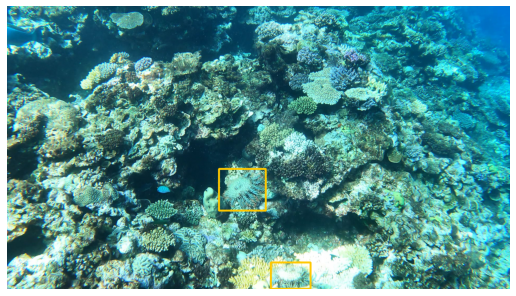

In [117]:
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(9, 9))
    plt.axis('off')
    im = plt.imshow(ims[0])

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//12)

images = [get_image(
    train_df[train_df['sequence'] == unique_sequences[0]],
    idx=idx
) for idx in range(30,60)]

create_animation(images)